In [1]:
import pandas as pd
import numpy as np

import cirpy

import rdkit
from rdkit import Chem, DataStructs
from rdkit.Chem import AllChem, PandasTools, Descriptors, MolFromSmiles, Draw, inchi
from rdkit.Chem.Descriptors import ExactMolWt
from rdkit.ML.Descriptors.Descriptors import DescriptorCalculator
from rdkit.ML.Descriptors.MoleculeDescriptors import MolecularDescriptorCalculator
from rdkit import RDConfig
from rdkit.Chem import rdDepictor
from rdkit.Chem.Draw import rdMolDraw2D, IPythonConsole
from rdkit.Chem.PandasTools import ChangeMoleculeRendering

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import gridspec
import matplotlib.cm as cm

import os
from tqdm import tqdm

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import plotly.express as px

#Bokeh library for plotting
import json
from bokeh.plotting import figure, show, output_notebook, ColumnDataSource
from bokeh.models import HoverTool
from bokeh.transform import factor_cmap
from bokeh.plotting import figure, output_file, save
output_notebook()

from IPython.display import SVG

from curate.chem import structure_curation 

pd.set_option('display.max_columns',None)
pd.set_option('display.max_rows',None)

Loading BokehJS ...

In [2]:
def compute_descriptors(df, mol_column = 'molecule', standardise = False, md_to_skip = ['Ipc']):
    
    
    list_MD = [descriptor[0] for descriptor in Chem.Descriptors._descList if descriptor[0] not in md_to_skip]
    
    md_calculator = MolecularDescriptorCalculator(simpleList=list_MD)
    
    rdkit_descriptors = [md_calculator.CalcDescriptors(smile) for smile in tqdm(df[mol_column])]
    
    df_md_only = pd.DataFrame(data=rdkit_descriptors, columns = list_MD)
    df_md = pd.concat ([df, df_md_only], axis = 1 )
    
    to_return = df_md
    
    if standardise:
        
        s = StandardScaler()
        rdkit_descriptors_standardised = s.fit_transform(rdkit_descriptors)
        
        df_md_standardised_only = pd.DataFrame(data=rdkit_descriptors_standardised, columns = list_MD)
        df_md_standardised = pd.concat([df,df_md_standardised_only], axis=1)
        
        to_return = df_md_standardised
        
    return to_return

In [3]:
def compute_morgan_FPs(df, mol_column = 'molecule', nBits=2048):
    
    num_objects = len(df)
    xmatrix = np.zeros((num_objects, nBits), dtype=np.int8)

    
    names_fingerprints = ['fp_'+ str(number) for number in range(nBits) ]
    
    fp_array = []
    
    for index, mol in enumerate(tqdm(df[mol_column])):
        
        fp = AllChem.GetMorganFingerprintAsBitVect(mol, 2, nBits, useFeatures=True)

        DataStructs.ConvertToNumpyArray(fp,xmatrix [index])
        

    fp_df = pd.DataFrame(data=xmatrix, columns=names_fingerprints)

    df_fp = pd.concat([df, fp_df], axis=1)
    df_fp.dropna(subset=names_fingerprints, inplace=True)
    
    return df_fp


In [4]:
def make_pca(X):
    
    pca = PCA(n_components=2)

    PrincipalComponents = pca.fit_transform(X)
    
    PC_df = pd.DataFrame(data = PrincipalComponents, columns = ['PCA1', 'PCA2'])
    #PC_dataframe = pd.concat([original_df, PC_df], axis =1)
    
    #PC_dataframe[Y.name] = [int(number) for number in Y]
    #PC_dataframe['ID'] = df['ID']
    
    explained_variance = np.around(pca.explained_variance_ratio_, decimals =4) * 100
    
    
    #sns.set(rc={'figure.figsize':(10,10)}, font_scale=1.5)
    #sns.set_style('whitegrid')
    
    
    return PC_df, explained_variance



In [5]:
ames_predeep = r"G:\My Drive\UPF\projects\dst\tox_evidence_combination_DST\data\raw\predeep_combined_genetox_standard_raw.xlsx"

In [6]:
df = pd.DataFrame(pd.read_excel(ames_predeep))
df.head()

,source,name,casrn,assay_category,assay_type,assay_result,species,strain,metabolic_activation,cytotoxicity,data_quality,reference,year,document_source,duration,assay_potency,comment,document_number,title,genetox_results,reference_url,genetox_note,protocol_era,assay_code,sex,dose_response,panel_report,glp,guideline,dtxsid,assay_type_standard
0,eChemPortal,"1,3,5-trinitro-1,3,5-triazinane",121-82-4,in vitro,fluctuation test,negative,S. typhimurium TA 98,NaN,with and without,not determined,2 (reliable with restrictions),NaN,1999,NaN,NaN,NaN,NaN,NaN,NaN,negative,https://echa.europa.eu/registration-dossier/-/...,NaN,NaN,NaN,NaN,NaN,NaN,no data,equivalent or similar to OECD Guideline 471 (B...,DTXSID9024142,Ames fluctuation test
1,eChemPortal,"1,3,5-trinitro-1,3,5-triazinane",121-82-4,in vitro,fluctuation test,negative,S. typhimurium TA 100,NaN,with and without,not determined,2 (reliable with restrictions),NaN,1999,NaN,NaN,NaN,NaN,NaN,NaN,negative,https://echa.europa.eu/registration-dossier/-/...,NaN,NaN,NaN,NaN,NaN,NaN,no data,equivalent or similar to OECD Guideline 471 (B...,DTXSID9024142,Ames fluctuation test
2,eChemPortal,"1,3,5-trinitro-1,3,5-triazinane",121-82-4,in vitro,fluctuation test,negative,S. typhimurium TA 98,NaN,with and without,not determined,2 (reliable with restrictions),NaN,1999,NaN,NaN,NaN,NaN,NaN,NaN,negative,https://echa.europa.eu/registration-dossier/-/...,NaN,NaN,NaN,NaN,NaN,NaN,no data,equivalent or similar to OECD Guideline 471 (B...,DTXSID9024142,Ames fluctuation test
3,eChemPortal,nickel(2+) dichloride,7718-54-9,in vitro,bacterial fluctuation assay,negative,"other: E. coli strains WP2+, WP2-, WP6, WP67, ...",NaN,with,yes,2 (reliable with restrictions),NaN,1986,NaN,NaN,NaN,NaN,NaN,NaN,negative,https://echa.europa.eu/registration-dossier/-/...,NaN,NaN,NaN,NaN,NaN,NaN,no data,according to other guideline: Gatehouse 1978 (...,DTXSID7040316,Ames fluctuation test
4,eChemPortal,nickel(2+) ion dichloride,7718-54-9,in vitro,bacterial fluctuation assay,negative,"other: E. coli strains WP2+, WP2-, WP6, WP67, ...",NaN,with,yes,2 (reliable with restrictions),NaN,1986,NaN,NaN,NaN,NaN,NaN,NaN,negative,https://echa.europa.eu/registration-dossier/-/...,NaN,NaN,NaN,NaN,NaN,NaN,no data,according to other guideline: Gatehouse 1978 (...,DTXSID7040316,Ames fluctuation test


In [7]:
df.assay_type_standard.unique()

array(['Ames fluctuation test', 'bacterial DNA repair test',
       'bacterial forward mutation test',
       'bacterial reverse mutation test',
       'bacterial reverse mutation test|chromosome aberrations|DNA damage/repair|gene mutation|host-mediated test|mitotic recombination',
       'bacterial reverse mutation test|comet test (in vitro)',
       'bacterial reverse mutation test|host-mediated test',
       'bacterial reverse mutation test|in vitro chromosome aberration test|sister chromatid exchange (in vitro)|gene mutation test (in vitro)|in vitro mitotic gene conversion|recombination test|DNA damage/repair',
       'bacterial reverse mutation test|mammalian gene mutation test (in vitro)',
       'bacterial reverse mutation test|microsomial mutagenesis test|host-mediated test',
       'bacterial reverse mutation test|mitotic recombination test|gene mutation test (in vitro)|host-mediated test',
       'bacterial reverse mutation test|sister chromatid test|mammalian gene mutation t

In [8]:
ames = df.loc[df['assay_type'].str.contains("ames", case=False,na=False)]
ames.head(10)

,source,name,casrn,assay_category,assay_type,assay_result,species,strain,metabolic_activation,cytotoxicity,data_quality,reference,year,document_source,duration,assay_potency,comment,document_number,title,genetox_results,reference_url,genetox_note,protocol_era,assay_code,sex,dose_response,panel_report,glp,guideline,dtxsid,assay_type_standard
1746,EFSA,Acetochlor,34256-82-1,in vitro,Ames,positive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DTXSID8023848,bacterial reverse mutation test
1747,Kirkland_2005_2011,4-Acetylaminofluorene,28322-02-3,in vitro,Ames,positive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DTXSID1020019,bacterial reverse mutation test
1748,Kirkland_2005_2011,N-Acetoxy-2-acetylaminofluorene,6098-44-8,in vitro,Ames,positive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DTXSID90209828,bacterial reverse mutation test
1749,Kirkland_2005_2011,1'-Acetoxysafrole,34627-78-6,in vitro,Ames,positive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DTXSID5039226,bacterial reverse mutation test
1750,Kirkland_2005_2011,2-Acetylaminofluorene,53-96-3,in vitro,Ames,positive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DTXSID0039227,bacterial reverse mutation test
1751,US_NTP,2-Acetylaminofluorene,53-96-3,in vitro,Ames,positive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DTXSID0039227,bacterial reverse mutation test
1752,Kirkland_2005_2011,1-Acetyl-2-phenylhydrazine,114-83-0,in vitro,Ames,positive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DTXSID1020015,bacterial reverse mutation test
1753,Kirkland_2005_2011,Acrolein,107-02-8,in vitro,Ames,positive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DTXSID5020023,bacterial reverse mutation test
1754,Kirkland_2005_2011,Acrylonitrile,107-13-1,in vitro,Ames,positive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DTXSID5020029,bacterial reverse mutation test
1755,US_NTP,Acrylonitrile,107-13-1,in vitro,Ames,positive,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,DTXSID5020029,bacterial reverse mutation test


In [9]:
len(ames.casrn.unique()), len(ames)

(2770, 3675)

In [10]:
ames.assay_type.unique()

array(['Ames', 'Ames Salmonella reversion assay',
       'bacterial reverse mutation assay (e.g. Ames test)',
       'Liquid suspension assay (Modified Salmonella/Mammalian-Microsome Mutagenicity Test (Ames Preincubation Test))',
       'according to B Ames et al. (1975) Mutat Res 31:347-364',
       'Ames study', 'Ames test & SOS Chromotest',
       'Salmonella/microsome test (Ames test) and chromosomal abberation  test in vitro',
       'modified Ames assay', 'Modified Ames test',
       'bacterial reverse mutation assay (Modified Ames test)',
       'Ames test and DNA-repair test',
       'Salmonella and Escherichia strains: bacterial reverse mutation assay (e.g. Ames test) ; Bacillus strains: recombination assay',
       'Histidine reverse gene mutation, Ames assay',
       'Ames test and Comet assay',
       'Ames test and Comet assay (in-vitro)',
       'Ames Salmonella typhimurium AND Mouse Lymphoma cell mutation assay',
       '3 different methods: direct bacterial assay (ames 

In [11]:
ames_only = df[(df.assay_type.isin(['Ames','Ames Salmonella reversion assay','bacterial reverse mutation assay (e.g. Ames test)','Ames study','Histidine reverse gene mutation, Ames assay']) ) & df.assay_result.isin(['positive','negative'])]

In [12]:
ames_only['assay_result_num'] = [0 if x == 'negative' else 1 for x in ames_only['assay_result']]


C:\Users\karol\anaconda3\envs\jupyter\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [13]:
ames_only_fil = ames_only[['name','casrn','assay_result_num','data_quality']]

In [14]:
ames_only_fil['smiles'] = [cirpy.resolve(compound, 'smiles') for compound in tqdm(ames_only_fil['casrn']) ]

100%|██████████████████████████████████████████████████████████████████████████████| 3517/3517 [30:00<00:00,  1.95it/s]
C:\Users\karol\anaconda3\envs\jupyter\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [51]:
len(ames_only_fil)

3417

In [52]:
ames_only_fil.dropna(subset=['smiles'],inplace=True)
ames_only_fil.reset_index(inplace=True, drop=True)

C:\Users\karol\anaconda3\envs\jupyter\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [53]:
## Groupby!!! check KNIME workflow for details

# group_col = casrn, agg('name':'first', 'assay_result_num':'mode', 'data_quality':'mode', 'smiles':'first')

ames_only_fil.to_csv(r"G:\My Drive\UPF\projects\dst\_tox_evidence_combination\data\curated\predeep_ames_NOT_grouped.tsv", sep='\t')


In [54]:
data = pd.DataFrame(pd.read_excel(r"G:\My Drive\UPF\projects\dst\_tox_evidence_combination\data\curated\predeep_ames_GROUPED.xlsx") )

data.head()

,casrn,name,assay_result_num,data_quality,smiles
0,100-00-5,1-Chloro-4-nitrobenzene,1,NaN,[O-][N+](=O)c1ccc(Cl)cc1
1,100-01-6,p-Nitroaniline,1,NaN,Nc1ccc(cc1)[N+]([O-])=O
2,100-02-7,p-Nitrophenol,0,NaN,Oc1ccc(cc1)[N+]([O-])=O
3,100-03-8,4-Chlorobenzenesulphinic acid,0,NaN,O[S](=O)c1ccc(Cl)cc1
4,100-14-1,p-Nitrobenzyl chloride,1,NaN,[O-][N+](=O)c1ccc(CCl)cc1


In [55]:
cur = structure_curation.Curator()

for i, row in data.iterrows():
    
    smile = row['smiles']

    cur.get_rdkit_mol(smile)
    mol = cur.smiles_mol
    
    try:
        sub, final_smile = cur.filter_smiles()

        data.loc[data.index == i,'compound_class'] = sub
        data.loc[data.index == i,'structure_curated'] = final_smile
    
    except:
        
        data.loc[data.index == i,'compound_class'] = None
        data.loc[data.index == i,'structure_curated'] = None

data.drop(columns='smiles',inplace=True)


In [56]:
data.dropna(subset= ['structure_curated'], inplace=True)
data.reset_index(inplace=True, drop=True)

In [57]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2592 entries, 0 to 2591
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   casrn              2592 non-null   object
 1   name               2592 non-null   object
 2   assay_result_num   2592 non-null   int64 
 3   data_quality       6 non-null      object
 4   compound_class     2592 non-null   object
 5   structure_curated  2592 non-null   object
dtypes: int64(1), object(5)
memory usage: 121.6+ KB


In [58]:
PandasTools.AddMoleculeColumnToFrame(data, smilesCol='structure_curated', molCol='molecule', includeFingerprints=True)

In [59]:
data.dropna(subset= ['molecule'], inplace=True)
data.reset_index(inplace=True, drop=True)

In [60]:
data['molecule'].isnull().values.any()

False

In [61]:
data.compound_class.unique()

array(['organic', 'organic_salt', 'inorganic_salt', 'inorganic',
       'organometallic', 'inorganic_metal'], dtype=object)

In [62]:
organic_only = data[data['compound_class'] == 'organic']

In [63]:
organic_only['MW'] = [ExactMolWt(mols) for mols in organic_only['molecule']]


C:\Users\karol\anaconda3\envs\jupyter\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [64]:
organic_big_small = organic_only[(organic_only['MW'] < 80) | (organic_only['MW'] > 900)].index.to_list()

organic_filtered = organic_only.copy()

organic_filtered.drop(index=organic_big_small,inplace=True)
organic_filtered.reset_index(inplace=True, drop=True)

len(organic_filtered), len(organic_only)

(2104, 2239)

In [65]:
organic_filtered.drop(columns='MW', inplace=True)

,casrn,name,assay_result_num,data_quality,compound_class,structure_curated,molecule
0,100-00-5,1-Chloro-4-nitrobenzene,1,NaN,organic,O=[N+]([O-])c1ccc(Cl)cc1,

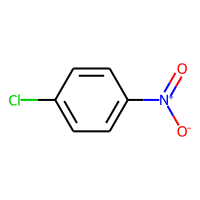

In [66]:
organic_filtered.head(1)

In [67]:
des = compute_descriptors(organic_filtered, standardise=True)
des.columns[6:]

100%|█████████████████████████████████████████████████████████████████████████████| 2104/2104 [00:10<00:00, 191.38it/s]


Index(['molecule', 'MaxEStateIndex', 'MinEStateIndex', 'MaxAbsEStateIndex',
       'MinAbsEStateIndex', 'qed', 'MolWt', 'HeavyAtomMolWt', 'ExactMolWt',
       'NumValenceElectrons',
       ...
       'fr_sulfide', 'fr_sulfonamd', 'fr_sulfone', 'fr_term_acetylene',
       'fr_tetrazole', 'fr_thiazole', 'fr_thiocyan', 'fr_thiophene',
       'fr_unbrch_alkane', 'fr_urea'],
      dtype='object', length=208)

In [68]:
des.dropna(subset=des.columns[6:], inplace=True)
des.reset_index(inplace=True, drop=True)

,casrn,name,assay_result_num,data_quality,compound_class,structure_curated,molecule,PCA1,PCA2
0,100-00-5,1-Chloro-4-nitrobenzene,1,NaN,organic,O=[N+]([O-])c1ccc(Cl)cc1,,-3.627068,0.907664

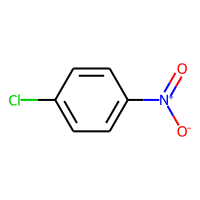

In [69]:
pca_res = make_pca(des.iloc[:,7:])[0]
new = pd.concat([organic_filtered, make_pca(des.iloc[:,7:])[0]], axis=1, join = 'inner')
new.head(1)

In [70]:
new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2103 entries, 0 to 2102
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   casrn              2103 non-null   object 
 1   name               2103 non-null   object 
 2   assay_result_num   2103 non-null   int64  
 3   data_quality       4 non-null      object 
 4   compound_class     2103 non-null   object 
 5   structure_curated  2103 non-null   object 
 6   molecule           2103 non-null   object 
 7   PCA1               2103 non-null   float64
 8   PCA2               2103 non-null   float64
dtypes: float64(2), int64(1), object(6)
memory usage: 148.0+ KB


In [71]:
make_pca(des.iloc[:,7:])[1]

array([16.64,  7.9 ])

In [72]:
new_positive = new[new['assay_result_num'] == 1]
new_negative = new[new['assay_result_num'] == 0]

In [73]:
def PrepareMols(mol, kekulize=True):
    
    binary_mol = Chem.Mol(mol.ToBinary())
    
    if kekulize:
        try:
            Chem.Kekulize(binary_mol)
        except:
            binary_mol = Chem.Mol(mol.ToBinary())
            
        if not binary_mol.GetNumConformers():
            rdDepictor.Compute2DCoords(binary_mol)
        return binary_mol
    
    
    
def moltosvg (mol, molSize = (450,200), drawer = None, **kwargs):
    
    binary_mol = PrepareMols(mol)
    
    if drawer is None:
        drawer = rdMolDraw2D.MolDraw2DSVG(molSize[0],molSize[1])
    
    drawer.DrawMolecule(binary_mol, **kwargs)
    drawer.FinishDrawing()
    
    svg = drawer.GetDrawingText()
    
    return SVG(svg.replace('svg:', ''))

In [74]:
new_pos = [moltosvg(mol).data for mol in new_positive.molecule]
new_neg = [moltosvg(mol).data for mol in new_negative.molecule]

In [75]:
ChangeMoleculeRendering(renderer='PNG')


source_pos = ColumnDataSource(data=dict(x=new_positive.loc[:,'PCA1'], y=new_positive.loc[:,'PCA2'], desc= new_positive.casrn, 
                                    svgs=new_pos))

source_neg = ColumnDataSource(data=dict(x=new_negative.loc[:,'PCA1'], y=new_negative.loc[:,'PCA2'], desc= new_negative.casrn, 
                                    svgs=new_neg))


hover = HoverTool(tooltips="""
    <div>
        <div>@svgs{safe}
        </div>
        <div>
            <span style="font-size: 17px; font-weight: bold;">@desc</span>
        </div>
    </div>
    """
)

interactive_map = figure(plot_width=600, plot_height=600, tools=['reset,box_zoom,wheel_zoom,zoom_in,zoom_out,pan',hover],
           title="Bacterial ames",x_axis_label = 'PCA1', y_axis_label = 'PCA2', )

interactive_map.circle('x', 'y', size=15, source=source_pos, fill_alpha=0.2,color='#e32400',legend_label='Positive')


interactive_map.circle('x', 'y', size=15, source=source_neg, fill_alpha=0.2,color='#0033cc',legend_label='Negative')


#interactive_map.legend.location = "top_left"
interactive_map.legend.click_policy="hide"

In [76]:
show(interactive_map)

In [77]:
to_drop = new[(new['casrn'].isin(['128-57-4', '3896-11-5', '6425-39-4', '8003-22-3', '81-20-9', '81-77-6'])) | (new['name'] == 'Diphenyl_diselenide')].index.to_list()

In [78]:
new.drop(index=to_drop,inplace=True)
new.reset_index(inplace=True, drop=True)

In [79]:
make_pca(new.iloc[:,7:])[1]

array([66.09, 33.91])

100%|████████████████████████████████████████████████████████████████████████████| 2097/2097 [00:00<00:00, 4396.24it/s]


,casrn,name,assay_result_num,data_quality,compound_class,structure_curated,molecule,fp_0,fp_1,fp_2,fp_3,fp_4,fp_5,fp_6,fp_7,fp_8,fp_9,fp_10,fp_11,fp_12,fp_13,fp_14,fp_15,fp_16,fp_17,fp_18,fp_19,fp_20,fp_21,fp_22,fp_23,fp_24,fp_25,fp_26,fp_27,fp_28,fp_29,fp_30,fp_31,fp_32,fp_33,fp_34,fp_35,fp_36,fp_37,fp_38,fp_39,fp_40,fp_41,fp_42,fp_43,fp_44,fp_45,fp_46,fp_47,fp_48,fp_49,fp_50,fp_51,fp_52,fp_53,fp_54,fp_55,fp_56,fp_57,fp_58,fp_59,fp_60,fp_61,fp_62,fp_63,fp_64,fp_65,fp_66,fp_67,fp_68,fp_69,fp_70,fp_71,fp_72,fp_73,fp_74,fp_75,fp_76,fp_77,fp_78,fp_79,fp_80,fp_81,fp_82,fp_83,fp_84,fp_85,fp_86,fp_87,fp_88,fp_89,fp_90,fp_91,fp_92,fp_93,fp_94,fp_95,fp_96,fp_97,fp_98,fp_99,fp_100,fp_101,fp_102,fp_103,fp_104,fp_105,fp_106,fp_107,fp_108,fp_109,fp_110,fp_111,fp_112,fp_113,fp_114,fp_115,fp_116,fp_117,fp_118,fp_119,fp_120,fp_121,fp_122,fp_123,fp_124,fp_125,fp_126,fp_127,fp_128,fp_129,fp_130,fp_131,fp_132,fp_133,fp_134,fp_135,fp_136,fp_137,fp_138,fp_139,fp_140,fp_141,fp_142,fp_143,fp_144,fp_145,fp_146,fp_147,fp_148,fp_149,fp_150,fp_151,fp_152,fp_153,fp_154,fp_155,fp_156,fp_157,fp_158,fp_159,fp_160,fp_161,fp_162,fp_163,fp_164,fp_165,fp_166,fp_167,fp_168,fp_169,fp_170,fp_171,fp_172,fp_173,fp_174,fp_175,fp_176,fp_177,fp_178,fp_179,fp_180,fp_181,fp_182,fp_183,fp_184,fp_185,fp_186,fp_187,fp_188,fp_189,fp_190,fp_191,fp_192,fp_193,fp_194,fp_195,fp_196,fp_197,fp_198,fp_199,fp_200,fp_201,fp_202,fp_203,fp_204,fp_205,fp_206,fp_207,fp_208,fp_209,fp_210,fp_211,fp_212,fp_213,fp_214,fp_215,fp_216,fp_217,fp_218,fp_219,fp_220,fp_221,fp_222,fp_223,fp_224,fp_225,fp_226,fp_227,fp_228,fp_229,fp_230,fp_231,fp_232,fp_233,fp_234,fp_235,fp_236,fp_237,fp_238,fp_239,fp_240,fp_241,fp_242,fp_243,fp_244,fp_245,fp_246,fp_247,fp_248,fp_249,fp_250,fp_251,fp_252,fp_253,fp_254,fp_255,fp_256,fp_257,fp_258,fp_259,fp_260,fp_261,fp_262,fp_263,fp_264,fp_265,fp_266,fp_267,fp_268,fp_269,fp_270,fp_271,fp_272,fp_273,fp_274,fp_275,fp_276,fp_277,fp_278,fp_279,fp_280,fp_281,fp_282,fp_283,fp_284,fp_285,fp_286,fp_287,fp_288,fp_289,fp_290,fp_291,fp_292,fp_293,fp_294,fp_295,fp_296,fp_297,fp_298,fp_299,fp_300,fp_301,fp_302,fp_303,fp_304,fp_305,fp_306,fp_307,fp_308,fp_309,fp_310,fp_311,fp_312,fp_313,fp_314,fp_315,fp_316,fp_317,fp_318,fp_319,fp_320,fp_321,fp_322,fp_323,fp_324,fp_325,fp_326,fp_327,fp_328,fp_329,fp_330,fp_331,fp_332,fp_333,fp_334,fp_335,fp_336,fp_337,fp_338,fp_339,fp_340,fp_341,fp_342,fp_343,fp_344,fp_345,fp_346,fp_347,fp_348,fp_349,fp_350,fp_351,fp_352,fp_353,fp_354,fp_355,fp_356,fp_357,fp_358,fp_359,fp_360,fp_361,fp_362,fp_363,fp_364,fp_365,fp_366,fp_367,fp_368,fp_369,fp_370,fp_371,fp_372,fp_373,fp_374,fp_375,fp_376,fp_377,fp_378,fp_379,fp_380,fp_381,fp_382,fp_383,fp_384,fp_385,fp_386,fp_387,fp_388,fp_389,fp_390,fp_391,fp_392,fp_393,fp_394,fp_395,fp_396,fp_397,fp_398,fp_399,fp_400,fp_401,fp_402,fp_403,fp_404,fp_405,fp_406,fp_407,fp_408,fp_409,fp_410,fp_411,fp_412,fp_413,fp_414,fp_415,fp_416,fp_417,fp_418,fp_419,fp_420,fp_421,fp_422,fp_423,fp_424,fp_425,fp_426,fp_427,fp_428,fp_429,fp_430,fp_431,fp_432,fp_433,fp_434,fp_435,fp_436,fp_437,fp_438,fp_439,fp_440,fp_441,fp_442,fp_443,fp_444,fp_445,fp_446,fp_447,fp_448,fp_449,fp_450,fp_451,fp_452,fp_453,fp_454,fp_455,fp_456,fp_457,fp_458,fp_459,fp_460,fp_461,fp_462,fp_463,fp_464,fp_465,fp_466,fp_467,fp_468,fp_469,fp_470,fp_471,fp_472,fp_473,fp_474,fp_475,fp_476,fp_477,fp_478,fp_479,fp_480,fp_481,fp_482,fp_483,fp_484,fp_485,fp_486,fp_487,fp_488,fp_489,fp_490,fp_491,fp_492,fp_493,fp_494,fp_495,fp_496,fp_497,fp_498,fp_499,fp_500,fp_501,fp_502,fp_503,fp_504,fp_505,fp_506,fp_507,fp_508,fp_509,fp_510,fp_511,fp_512,fp_513,fp_514,fp_515,fp_516,fp_517,fp_518,fp_519,fp_520,fp_521,fp_522,fp_523,fp_524,fp_525,fp_526,fp_527,fp_528,fp_529,fp_530,fp_531,fp_532,fp_533,fp_534,fp_535,fp_536,fp_537,fp_538,fp_539,fp_540,fp_541,fp_542,fp_543,fp_544,fp_545,fp_546,fp_547,fp_548,fp_549,fp_550,fp_551,fp_552,fp_553,fp_554,fp_555,fp_556,fp_557,fp_558,fp_559,fp_560,fp_561,fp_562,fp_563,fp_564,fp_565,fp_566,fp_567,fp_568,fp_569,fp_570,fp_571,fp_572,fp_573,fp_574,f
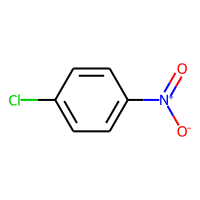

In [80]:
new_fp = compute_morgan_FPs(new.iloc[:,:-2])
new_fp.dropna(subset=new_fp.columns[8:], inplace=True)
new_fp.reset_index(inplace=True, drop=True)
new_fp.head(1)

,casrn,name,assay_result_num,data_quality,compound_class,structure_curated,molecule,PCA1,PCA2
0,100-00-5,1-Chloro-4-nitrobenzene,1,NaN,organic,O=[N+]([O-])c1ccc(Cl)cc1,,-1.369593,0.313841

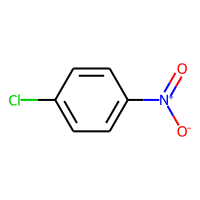

In [81]:
pca_fp = pd.concat([new.iloc[:,:-2], make_pca(new_fp.iloc[:,7:])[0]], axis=1, join = 'inner')
pca_fp.head(1)

In [82]:
new_pca = pca_fp.copy()
new_pca.assay_result_num = new_pca.assay_result_num.astype(str)
fig = px.scatter(data_frame=new_pca,x="PCA1",y="PCA2",color="assay_result_num", hover_name=new_pca.name)
fig.update_traces(marker=dict(size=12, line=dict(width=2, color='DarkSlateGrey')), selector=dict(mode='markers'))
fig.show()

In [83]:
make_pca(new_pca.iloc[:,7:])[1]

array([62.2, 37.8])

In [84]:
new.drop(columns=['PCA1', 'PCA2'], inplace=True)

In [85]:
new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2097 entries, 0 to 2096
Data columns (total 7 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   casrn              2097 non-null   object
 1   name               2097 non-null   object
 2   assay_result_num   2097 non-null   int64 
 3   data_quality       3 non-null      object
 4   compound_class     2097 non-null   object
 5   structure_curated  2097 non-null   object
 6   molecule           2097 non-null   object
dtypes: int64(1), object(6)
memory usage: 114.8+ KB


In [1]:
PandasTools.WriteSDF(new, r"G:\My Drive\UPF\projects\dst\tox_evidence_combination_DST\data\curated\predeep_ames_curated.sdf", molColName='molecule', idName='name', properties=['casrn','name','assay_result_num','structure_curated','data_quality'])

NameError: name 'PandasTools' is not defined